In [1]:
# conda activate str 

# Data manipulation 
import os
import subprocess
import re
import pandas as pd
import numpy as np
from biopandas.pdb import PandasPdb

# Data viz
import matplotlib.pyplot as plt 
from matplotlib.patches import Patch
import seaborn as sns
import plotly.express as px

# data source 

In [2]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_plm = df_plm[["seq_id", "carp640M_logp"]]
df_annot_plm = pd.merge(df_annot, df_plm, on = "seq_id")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot_plm, on = "seq_id")
df_sbl_a = df_sbl[df_sbl.bla_class == "Class A"]

# load per class dsets and merge annots
# protein_family_header col was removed to avoid col duplication in the merged dset
df_a = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_A_esm1b.csv")
del df_a["protein_family_header"]
df_a = df_a.merge(df_annot_plm, on = "seq_id")

# load and merge representative dsets
df_sbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_sbl_esm1b.csv")
df_sbl90 = df_sbl90.merge(df_annot, on = "seq_id")

In [3]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = [
        "#name", "protein_family_header", "length", 'protein_family',"protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()
    
df_sbl.columns

Index(['tSNE1_esm1b', 'tSNE2_esm1b', 'seq_id', '#name', 'seq', 'length',
       'filename', 'protein_name', 'protein_family', 'bla_class',
       'bla_subclass', 'protein_family_header', 'molecular_weight',
       'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy',
       'helix', 'turn', 'sheet', 'is_clust90_rep', 'bitscore', 'Domain',
       'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species',
       'predicted_signal_peptide', 'Other_sigpept', 'SP(Sec/SPI)',
       'LIPO(Sec/SPII)', 'TAT(Tat/SPI)', 'TATLIPO(Sec/SPII)',
       'PILIN(Sec/SPIII)', 'CS Position', 'seq_without_sigpept',
       'carp640M_logp'],
      dtype='object')

# map fams

I took the fams studied in
"[Learning meaningful representations of protein sequences](https://www.nature.com/articles/s41467-022-29443-w)" that are  present in BLDB

12 fams in Class A1: 
TEM,
SHV, CumA, OXY, KLUA, CTX-M,
NMCA, SME, KPC, GES, BEL, BPS. 

11 fams in Class A2: PER, VEB, TLA, TLA2, CIA, CGA, CME, CSP, CblA, CfxA, CepA

In [5]:
know_a1 = ["TEM", "SHV", "CumA", "OXY", "KLUA", "CTX-M", "NMCA", "SME", "KPC", "GES", "BEL", "BPS"]
know_a2 = ["PER", "VEB", "TLA", "TLA2", "CIA", "CGA", "CME", "CSP", "CblA", "CfxA", "CepA"]
know_a12 = know_a1 + know_a2

In [6]:
df_sub = df_sbl_a.copy()

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

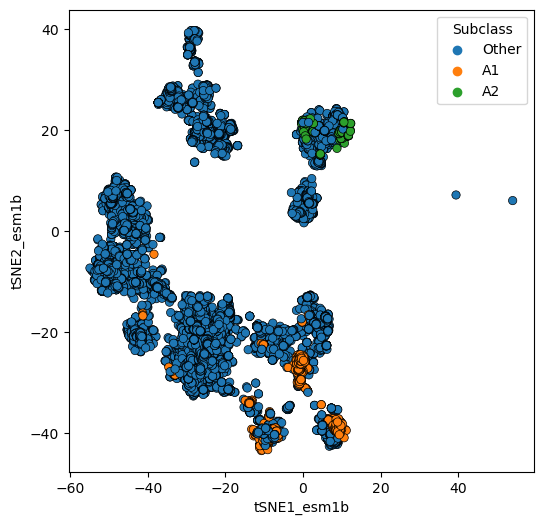

In [7]:
# based  
filters = [
    df_sub.protein_family_header.isin(know_a1), 
    df_sub.protein_family_header.isin(know_a2),
    ~df_sub.protein_family_header.isin(know_a12)
]

values = ["A1", "A2", "Other"]

df_sub["Subclass"] = np.select(filters, values)

plt.figure(figsize=(6,6))
sns.scatterplot(data = df_sub, x="tSNE1_esm1b", y="tSNE2_esm1b", alpha = 1, hue = "Subclass",edgecolor="black")

/tmp/ipykernel_435/1667633039.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clust90["Subclass"] = np.select(filters, values)


Text(0.5, 1.0, 'SeqSpace clustered at 90% identity')

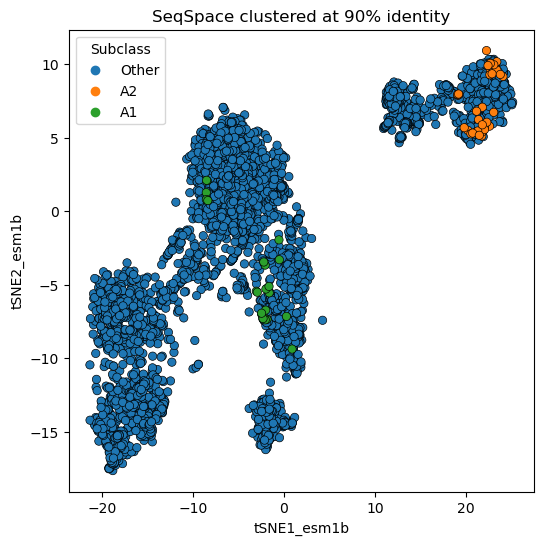

In [8]:
df_clust90 = df_sbl90[df_sbl90.bla_class.str.contains("Class A")]

# based  
filters = [
    df_clust90.protein_family_header.isin(know_a1), 
    df_clust90.protein_family_header.isin(know_a2),
    ~df_clust90.protein_family_header.isin(know_a12)
]


values = ["A1", "A2", "Other"]

df_clust90["Subclass"] = np.select(filters, values)

plt.figure(figsize=(6,6))
sns.scatterplot(
data = df_clust90.sort_values("Subclass", ascending=False), x="tSNE1_esm1b", y="tSNE2_esm1b", alpha = 1, 
hue = "Subclass",edgecolor="black")
plt.title("SeqSpace clustered at 90% identity")

In [9]:
do_iscatter(df_clust90, "Subclass")

In [10]:
! ls ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl*

../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_aa_composition.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_bepler.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_carp640M.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_esm.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_esm1b.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_t5bfd.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_t5xlu50.csv
../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_xlnet.csv


<AxesSubplot:xlabel='umap1_esm1b', ylabel='umap2_esm1b'>

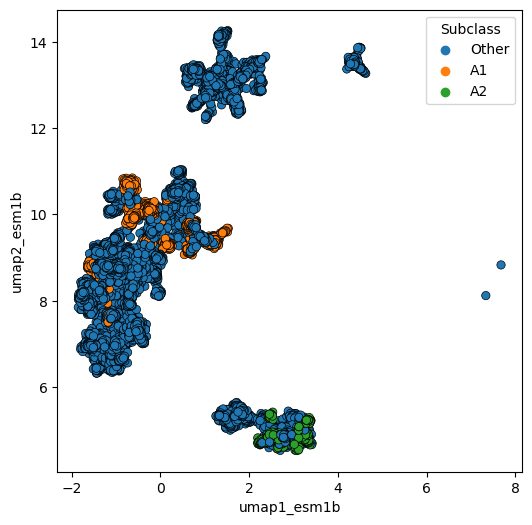

In [11]:
df_umap = pd.read_csv("../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_esm1b.csv")
df_umap = df_umap.merge(df_annot_plm, on = "seq_id")
df_umap = df_umap[df_umap.bla_class.str.contains("Class A")]

# based  
filters = [
    df_umap.protein_family_header.isin(know_a1), 
    df_umap.protein_family_header.isin(know_a2),
    ~df_umap.protein_family_header.isin(know_a12)
]

values = ["A1", "A2", "Other"]

df_umap["Subclass"] = np.select(filters, values)


plt.figure(figsize=(6,6))
sns.scatterplot(
data = df_umap, x="umap1_esm1b", y="umap2_esm1b",
hue = "Subclass",edgecolor="black")

# map structures 

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

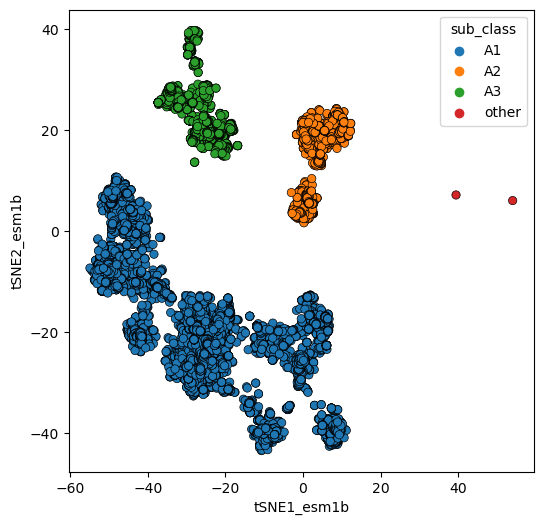

In [12]:
# Extraer los puntos con coordenadas X entre 0 y 10 e Y entre 0 y 15
conditions = [  
    #      X_left                        X_right                        y_bottom                       y_top
(df_sub['tSNE1_esm1b']> -5) & (df_sub['tSNE1_esm1b']< 15) & (df_sub['tSNE2_esm1b']> 0) & (df_sub['tSNE2_esm1b']< 25),
(df_sub['tSNE1_esm1b']> -40) & (df_sub['tSNE1_esm1b']< -15) & (df_sub['tSNE2_esm1b']> 13) & (df_sub['tSNE2_esm1b']< 40),
(df_sub['tSNE1_esm1b']> 35) & (df_sub['tSNE1_esm1b']< 55) & (df_sub['tSNE2_esm1b']> 0) & (df_sub['tSNE2_esm1b']< 10)
]

values = ['A2', 'A3', "other"]

df_sub["sub_class"]  = np.select(conditions, values)
df_sub["sub_class"] = df_sub.sub_class.str.replace("0", "A1")

plt.figure(figsize=(6,6))
sns.scatterplot(data = df_sub, x="tSNE1_esm1b", y="tSNE2_esm1b", alpha = 1, hue = "sub_class", edgecolor="black")

In [13]:
a1 = df_sub[df_sub["sub_class"].str.contains("A1")]
a2 = df_sub[df_sub["sub_class"].str.contains("A2")]
a3 = df_sub[df_sub["sub_class"].str.contains("A3")]

# export, convert to fasta, rand sample 20 and predict with AF2
# a1.to_csv("../results/subclass_a/a1.csv", index = False, sep = "\t")[["protein_name", "seq"]]
# a2.to_csv("../results/subclass_a/a2.csv", index = False, sep = "\t")[["protein_name", "seq"]]
# a3.to_csv("../results/subclass_a/a3.csv", index = False, sep = "\t")[["protein_name", "seq"]]

Rename AF2 predictions to get a simple name
```bash
rename "s/_relaxed_rank_1_model_3//" *pdb
```


In [14]:
# create a list of the sampled structrues and read it as df
df_names = pd.read_csv("../results/subclass_a/af2/wo_signal_peptide/sampled_structures_names.lst", names=["id"])

<AxesSubplot:xlabel='tSNE1_esm1b', ylabel='tSNE2_esm1b'>

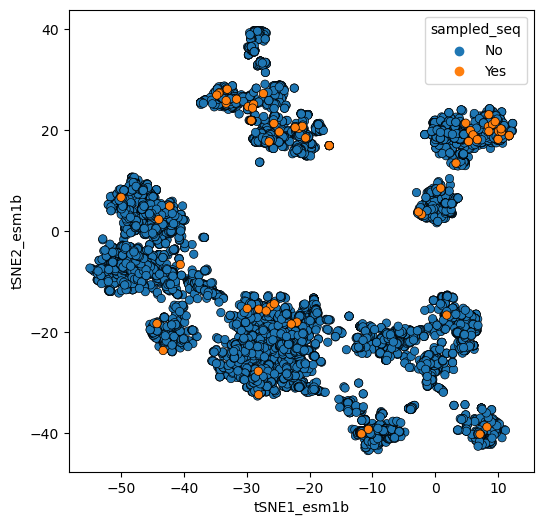

In [15]:
# map sampled structures 
filters = [
    df_sub.protein_name.isin(df_names.id),
    ~df_sub.protein_name.isin(df_names.id)  
]

values = ["Yes", "No"]

df_sub["sampled_seq"] = np.select(filters, values)

plt.figure(figsize=(6,6))
sns.scatterplot(
    data=df_sub[df_sub.tSNE1_esm1b.between(-60,20)].sort_values("sampled_seq"),
    x="tSNE1_esm1b",y="tSNE2_esm1b",
    hue="sampled_seq",edgecolor="black")

In [40]:
lra = pd.read_csv("../data/lra5/lra_5.csv", sep = "\t")
lra["name_tag"] = "LRA-5"
lra = lra[["name_tag", "seq"]]
lra

sampled_seqs_af2 = df_sub[df_sub.sampled_seq.str.contains("Yes")]
sampled_seqs_af2["name_tag"] = sampled_seqs_af2.sub_class + "_" + sampled_seqs_af2.protein_name 
sampled_seqs_af2["name_tag"] = sampled_seqs_af2["name_tag"].str.replace("A3", "A1F")
sampled_seqs_af2["name_tag"] = sampled_seqs_af2["name_tag"].str.replace("A1", "A01") 
sampled_seqs_af2["name_tag"] = sampled_seqs_af2["name_tag"].str.replace("A2", "A02") 

sampled_seqs_af2 =sampled_seqs_af2[["name_tag", "seq"]]

sampled_seqs_af2 = pd.concat([sampled_seqs_af2, lra])

sampled_seqs_af2.to_csv("/home/gama/desktop/tree/class_a_sampled_seqs_af2_lra5.csv", header = False, index = False, sep = "\t")

sampled_seqs_af2

/tmp/ipykernel_435/3559570438.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_435/3559570438.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_435/3559570438.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_435/355

,name_tag,seq
598,A01F_AFAM0496-12,MGLVLMVAGCSDEEKQVVKQSETEQTGGTNQTSENITAKETTIKKF...
618,A01F_AFAM0514-18,MKTWKEMFRTSKLKKMMPVLALSCAAAVSFSSSEVHAETVKCQRQE...
1221,A02_AFAM1133-3,MKHLRIILLALCSLCYITGLQAQSEQLKANIQEIIKDKKARIGVGI...
1276,A02_AFAM1186-5,MTKLSILLISFLTFQTFSQSTSDLRKELNQIIATKNATVGISIKSI...
1312,A02_AFAM1223-4,MIKNILLTLICLISFQLKSQSVQQLKKELQQIISTKNATFGISVKG...
...,...,...
11970,A01F_ROB-7,MLNKLKIGTLLLLTLTACLPNSVLSVTSNPQPASAPVQQSATQATF...
12328,A01_SHV-48,MRYIRLCIISLLATLPLAVHASPQPLEQIKLSESQLSGRVGMIEMD...
13000,A02_TLA-4,MKKHLVVIVFCALFASASAFAAKGTDSLKSSIEKYLKDKKAKVGVA...
13005,A02_TLA-9,MKKHLVVIVFCALFASASAFAAKGTDSLKSSIEKYLKDKKAKVGVA...


In [16]:
do_iscatter(df_sub[df_sub.tSNE1_esm1b.between(-60,20)], "sampled_seq")

In [15]:
# df_a[df_a.sampled_seq == "Yes"][["protein_name","seq_without_sigpept"]].to_csv("/home/gama/desktop/rand60_class_a.csv", index = False, sep = "\t")

In [17]:
# to save entries  
l_names = []
l_pLDDT = []

# per each pdb in the cdw 
for file in os.listdir("../results/subclass_a/af2/relaxed_pdbs/"):
    if file.endswith(".pdb"): 
        # get the mean val pLDDT 
        filename = "../results/subclass_a/af2/relaxed_pdbs/" + file
        pLDDT = PandasPdb().read_pdb(filename).df["ATOM"]['b_factor'].mean() 
        l_pLDDT.append(pLDDT)
        # get file name
        l_names.append(file)

# Sort by pLDDT
df_af2 = pd.DataFrame({'name':l_names,'pLDDT':l_pLDDT}).sort_values("pLDDT").reset_index(drop=True)
print("Top 5 worst models by pLDDT")
df_af2.head(5)

Top 5 worst models by pLDDT


,name,pLDDT
0,AFAM6234_273.pdb,86.559768
1,AFAM6234_327.pdb,86.616917
2,AFAM6234_197.pdb,87.011573
3,BcI_295.pdb,88.255186
4,AFAM2702_1.pdb,88.567992


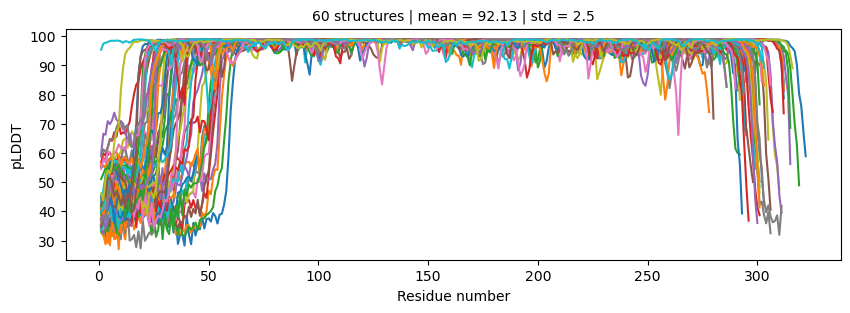

In [18]:
plt.figure(figsize=(10,3))
for file in df_af2["name"]:
    filename = "../results/subclass_a/af2/relaxed_pdbs/" + file
    a = PandasPdb().read_pdb(filename).df["ATOM"].groupby("residue_number", as_index=False)["b_factor"].mean()
    g = sns.lineplot(data=a, x ="residue_number", y ="b_factor").set_title(
        f"60 structures | mean = {np.round(np.mean(df_af2.pLDDT), 2)} | std = {np.round(np.std(df_af2.pLDDT),2)}")
    g.set_fontsize(10)
    plt.xlabel('Residue number',size=10)
    plt.ylabel('pLDDT',size=10)
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)

In [19]:
# the same data but with str preds wo signal peptide 
l_names = []
l_pLDDT = []

# per each pdb in the cdw 
for file in os.listdir("../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/"):
    if file.endswith(".pdb"): 
        # get the mean val pLDDT 
        filename = "../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/" + file
        pLDDT = PandasPdb().read_pdb(filename).df["ATOM"]['b_factor'].mean() 
        l_pLDDT.append(pLDDT)
        # get file name
        l_names.append(file)

# Sort by pLDDT
df_af2 = pd.DataFrame({'name':l_names,'pLDDT':l_pLDDT}).sort_values("pLDDT").reset_index(drop=True)
print("Top 5 worst models by pLDDT")
df_af2.head(5)

Top 5 worst models by pLDDT


,name,pLDDT
0,AFAM2633-8.pdb,89.759478
1,AFAM6234-273.pdb,91.437938
2,PenB-P3.pdb,91.465917
3,AFAM6234-197.pdb,92.005652
4,AFAM6234-327.pdb,92.474874


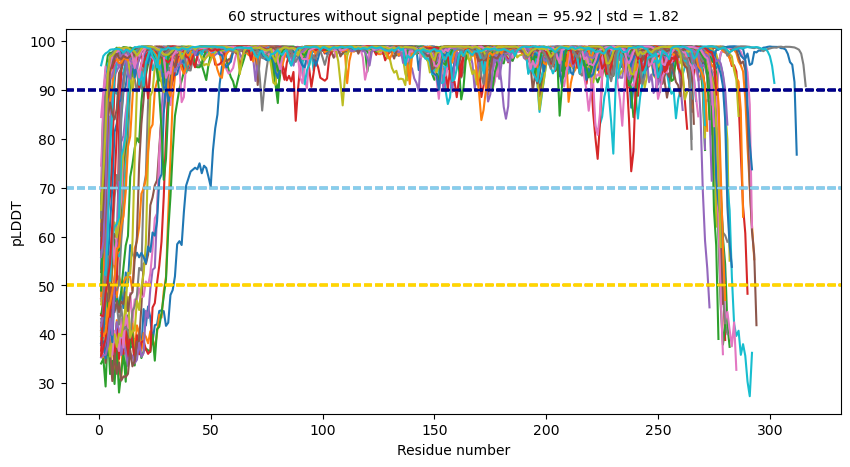

In [20]:
plt.figure(figsize=(10,5))
for file in df_af2["name"]:
    filename = "../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/" + file
    a = PandasPdb().read_pdb(filename).df["ATOM"].groupby("residue_number", as_index=False)["b_factor"].mean()
    g = sns.lineplot(data=a, x ="residue_number", y ="b_factor").set_title(
        f"60 structures without signal peptide | mean = {np.round(np.mean(df_af2.pLDDT), 2)} | std = {np.round(np.std(df_af2.pLDDT),2)}")
    g.set_fontsize(10)
    plt.xlabel('Residue number',size=10)
    plt.ylabel('pLDDT',size=10)
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)
    plt.axhline(y=90, color='darkblue', linestyle='--', alpha = 0.5)
    plt.axhline(y=70, color='skyblue', linestyle='--', alpha = 0.5)
    plt.axhline(y=50, color='gold', linestyle='--', alpha = 0.5)

100 rand in protein subclass A2 Proteobacteria region

In [21]:
# to save entries  
l_names2 = []
l_pLDDT2 = []

# per each pdb in the cdw 
for file in os.listdir("/home/gama/desktop/a2_proteobacteria_rand100/"):
    if file.endswith(".pdb"): 
        # get the mean val pLDDT 
        filename = "/home/gama/desktop/a2_proteobacteria_rand100/" + file
        pLDDT = PandasPdb().read_pdb(filename).df["ATOM"]['b_factor'].mean() 
        l_pLDDT2.append(pLDDT)
        # get file name
        l_names2.append(file)

# Sort by pLDDT
df_af2_proteo = pd.DataFrame({'name':l_names2,'pLDDT':l_pLDDT2}).sort_values("pLDDT").reset_index(drop=True)
print("Top 5 worst models by pLDDT")
df_af2_proteo.head(5)

Top 5 worst models by pLDDT


,name,pLDDT
0,AFAM7232-13.pdb,86.303115
1,AFAM7252-4.pdb,86.478640
2,AFAM7343-1.pdb,86.662230
3,AFAM7279-2.pdb,86.727103
4,AFAM7165-1.pdb,87.148890


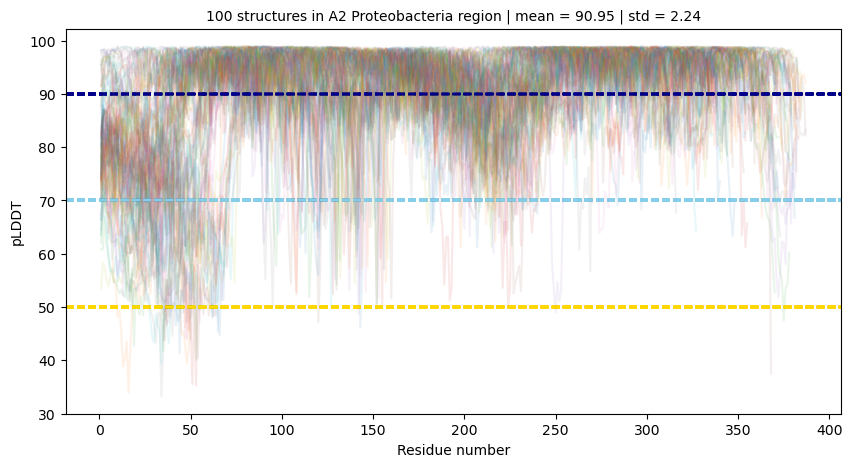

In [23]:
plt.figure(figsize=(10,5))
for file in df_af2_proteo["name"]:
    filename = "/home/gama/desktop/a2_proteobacteria_rand100/" + file
    a = PandasPdb().read_pdb(filename).df["ATOM"].groupby("residue_number", as_index=False)["b_factor"].mean()
    g = sns.lineplot(data=a, x ="residue_number", y ="b_factor", alpha = 0.1).set_title(
        f"100 structures in A2 Proteobacteria region | mean = {np.round(np.mean(df_af2_proteo.pLDDT), 2)} | std = {np.round(np.std(df_af2_proteo.pLDDT),2)}")
    g.set_fontsize(10)
    plt.xlabel('Residue number',size=10)
    plt.ylabel('pLDDT',size=10)
    plt.yticks(fontsize=10)
    plt.xticks(fontsize=10)
    plt.axhline(y=90, color='darkblue', linestyle='--', alpha = 0.5)
    plt.axhline(y=70, color='skyblue', linestyle='--', alpha = 0.5)
    plt.axhline(y=50, color='gold', linestyle='--', alpha = 0.5)

# clustering 

/home/gama/anaconda3/envs/str/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



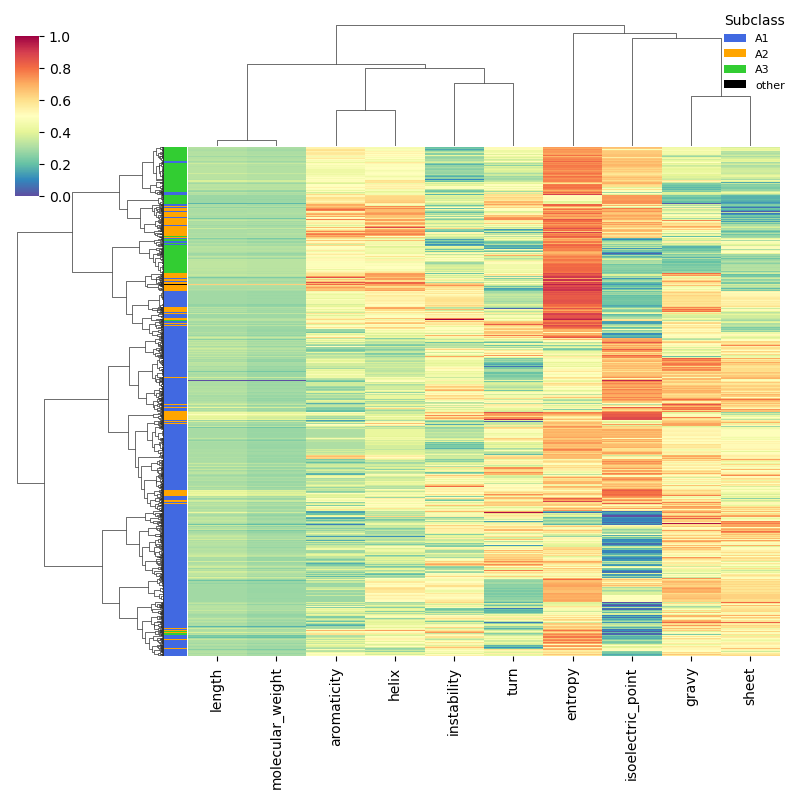

In [24]:
properties = ['sub_class','length','molecular_weight', 'aromaticity', 'instability', 'gravy', 
         'isoelectric_point','entropy','helix', 'turn', 'sheet'] 

df_clean = df_sub[properties].dropna()

# create a color palette and handles
colors = df_clean.sub_class.map({"A1": "royalblue", "A2": "orange", "A3": "limegreen","other":"black"})
lut = dict(zip(df_clean.sub_class.to_list(), colors))
handles = [Patch(facecolor = lut[name]) for name in lut]
    
sns.clustermap(
        data = df_clean.select_dtypes(["number"]), method = "ward", metric = "euclidean", annot = False, 
        cmap = "Spectral_r", row_colors = colors.to_list(), xticklabels = True, yticklabels = False, 
    standard_scale = 1, cbar_pos = (0.025, 0.76, 0.03,0.2), figsize=(8,8))
plt.legend(
    handles, lut, title = "Subclass", loc = "upper right", frameon = False, ncol = 1,
    bbox_to_anchor = (1, 1), bbox_transform = plt.gcf().transFigure, prop = {'size': 8})

In [25]:
# create a copy of the relaxed pdbs without signal peptide and manually rename each file  
# according to it subclass. I couldn't think of anything better to automate the process :( 
print(df_sub[(df_sub.sampled_seq == "Yes") & (df_sub.sub_class == "A3")].protein_name.to_list())

['AFAM0496-12', 'AFAM0514-18', 'AFAM2633-8', 'AFAM2702-1', 'AFAM2835-1', 'AFAM2835-16', 'AFAM2835-5', 'AFAM6234-161', 'AFAM6234-197', 'AFAM6234-273', 'AFAM6234-327', 'BcI-172', 'BcI-211', 'BcI-288', 'BcI-295', 'BcI-317', 'BcI-503', 'BcI-517', 'PenP-4', 'ROB-7']


In [26]:


# set the path of the data soure and create a empty list to collect data
path = "../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/labeled/"
pdbs = []

# retrive the paths per each pdb file
for root, dirs, files in os.walk(path):
    for file in files:
        if file.endswith(".pdb"):
            pdbs.append(os.path.join(root, file))

# create a df to save data         
df = pd.DataFrame(columns=[
    "file1","file2","len_struct1","len_struct2","aln_len","rmsd","seq_ident","tm_score1","tm_score2"])

# Align pdbs all vs all 
# pair1
for i in range(len(pdbs)):
    
    #pair2
    for j in range(len(pdbs)):
        
        # run TMalign and save the output text 
        command     = "TMalign {} {}".format(pdbs[i], pdbs[j])
        result_text = subprocess.run(command, shell = True, capture_output = True)
        output_text = result_text.stdout.decode()
        
        # collect data with regex
        len1    = re.search("Length of Chain_1 *: *([0-9.]+)", output_text).group(1)
        len2    = re.search("Length of Chain_2 *: *([0-9.]+)", output_text).group(1)
        aln_len = re.search("Aligned length *= *([0-9.]+)", output_text).group(1) 
        rmsd    = re.search("RMSD *= *([0-9.]+)", output_text).group(1)
        ident   = re.search("Seq_ID=n_identical/n_aligned *= *([0-9.]+)", output_text).group(1)
        tm1     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_1\)", output_text).group(1)
        tm2     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_2\)", output_text).group(1)
        
        # create a second df with the data and concat
        new_row = pd.DataFrame({
            "file1":files[i], "file2":files[j], "len_struct1":len1, "len_struct2":len2, 
            "aln_len":aln_len, "rmsd":rmsd, "seq_ident":ident, "tm_score1":tm1, "tm_score2":tm1
        }, index=[0])
        df = pd.concat([df,new_row], ignore_index=True)

# remove the .pdb strings
df["file1"] = df["file1"].str.replace(".pdb", "")
df["file2"] = df["file2"].str.replace(".pdb", "")
df.to_csv("../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/rand60struct_stats.csv", index = False)

IndexError: list index out of range

In [27]:
################################################################################## correcion gracias a ChatGPT

import os
import re
import pandas as pd
import subprocess

# set the path of the data source and create an empty list to collect data
path = "../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/labeled/"
pdbs = []

# retrieve the paths per each pdb file
for root, dirs, files in os.walk(path):
    for file in files:
        if file.endswith(".pdb"):
            pdbs.append(os.path.join(root, file))

# create a df to save data         
df = pd.DataFrame(columns=[
    "file1","file2","len_struct1","len_struct2","aln_len","rmsd","seq_ident","tm_score1","tm_score2"])

# Align pdbs all vs all 
# pair1
for i in range(len(pdbs)):
    
    #pair2
    for j in range(len(pdbs)):
        
        # run TMalign and save the output text 
        command     = "TMalign {} {}".format(pdbs[i], pdbs[j])
        result_text = subprocess.run(command, shell=True, capture_output=True)
        output_text = result_text.stdout.decode()
        
        # collect data with regex
        len1    = re.search("Length of Chain_1 *: *([0-9.]+)", output_text).group(1)
        len2    = re.search("Length of Chain_2 *: *([0-9.]+)", output_text).group(1)
        aln_len = re.search("Aligned length *= *([0-9.]+)", output_text).group(1) 
        rmsd    = re.search("RMSD *= *([0-9.]+)", output_text).group(1)
        ident   = re.search("Seq_ID=n_identical/n_aligned *= *([0-9.]+)", output_text).group(1)
        tm1     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_1\)", output_text).group(1)
        tm2     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_2\)", output_text).group(1)
        
        # create a second df with the data and concat
        new_row = pd.DataFrame({
            "file1": pdbs[i], "file2": pdbs[j], "len_struct1": len1, "len_struct2": len2, 
            "aln_len": aln_len, "rmsd": rmsd, "seq_ident": ident, "tm_score1": tm1, "tm_score2": tm1
        }, index=[0])
        df = pd.concat([df,new_row], ignore_index=True)


In [28]:
df["file1"] = df["file1"].str.replace(".pdb", "")
df["file2"] = df["file2"].str.replace(".pdb", "")
df

/tmp/ipykernel_605/2028248493.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.

/tmp/ipykernel_605/2028248493.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,265,265,265,0.00,1.000,1.00000,1.00000
1,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,265,275,260,2.10,0.242,0.89645,0.89645
2,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,265,267,260,1.60,0.373,0.93018,0.93018
3,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,265,272,262,1.09,0.481,0.96406,0.96406
4,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,265,280,261,1.80,0.330,0.92846,0.92846
...,...,...,...,...,...,...,...,...,...
3595,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,286,274,266,1.97,0.282,0.87051,0.87051
3596,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,286,271,265,1.78,0.377,0.88397,0.88397
3597,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,286,279,267,1.98,0.273,0.87009,0.87009
3598,../results/subclass_a/af2/wo_signal_peptides_r...,../results/subclass_a/af2/wo_signal_peptides_r...,286,278,265,2.14,0.238,0.85167,0.85167


In [32]:
jaja = df.copy()
jaja["file1"] = jaja["file1"].str.replace("../results/subclass_a/af2/wo_signal_peptides_relax/labeled/", "")
jaja["file2"] = jaja["file2"].str.replace("../results/subclass_a/af2/wo_signal_peptides_relax/labeled/", "")
jaja

/tmp/ipykernel_605/2805740492.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.

/tmp/ipykernel_605/2805740492.py:3: FutureWarning:

The default value of regex will change from True to False in a future version.



,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,A1_IMI-16,A1_IMI-16,265,265,265,0.00,1.000,1.00000,1.00000
1,A1_IMI-16,A2_AFAM1223-4,265,275,260,2.10,0.242,0.89645,0.89645
2,A1_IMI-16,A1_AFAM5546-1,265,267,260,1.60,0.373,0.93018,0.93018
3,A1_IMI-16,A1_PenB-40,265,272,262,1.09,0.481,0.96406,0.96406
4,A1_IMI-16,A1_AFAM5707-5,265,280,261,1.80,0.330,0.92846,0.92846
...,...,...,...,...,...,...,...,...,...
3595,A1_AFAM5490-12,A2_AFAM7636-1,286,274,266,1.97,0.282,0.87051,0.87051
3596,A1_AFAM5490-12,A3_BcI-295,286,271,265,1.78,0.377,0.88397,0.88397
3597,A1_AFAM5490-12,A2_AFAM1230-1,286,279,267,1.98,0.273,0.87009,0.87009
3598,A1_AFAM5490-12,A2_AFAM1133-3,286,278,265,2.14,0.238,0.85167,0.85167


In [34]:
def do_clustermap2(col, title):
    # create a sim matrix 
    df_sim = jaja.pivot_table(values = col, index = "file1", columns = "file2")
    
    # create a color palette and handles
    colors = df_sim.index.str[:2].map({"A1": "royalblue", "A2": "orange", "A3": "limegreen"})
    lut = dict(zip(df_sim.index.str[:2].to_list(), colors))
    handles = [Patch(facecolor = lut[name]) for name in lut]
    
    # plot
    g = sns.clustermap(
        data = df_sim, method = "ward", metric = "euclidean", annot = False, cmap = "Spectral_r",
        row_colors = colors.to_list(), col_colors = colors.to_list(), xticklabels = True, yticklabels = df_sim.index,
        cbar_kws={"label": title}, cbar_pos = (0.025, 0.76, 0.03,0.2))
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    plt.legend(
    handles, lut, title = "Subclass", loc = "best", frameon = False, ncol = 1,
    bbox_to_anchor = (.92, .97), bbox_transform = plt.gcf().transFigure, prop = {'size': 12})

/home/gama/anaconda3/envs/str/lib/python3.9/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



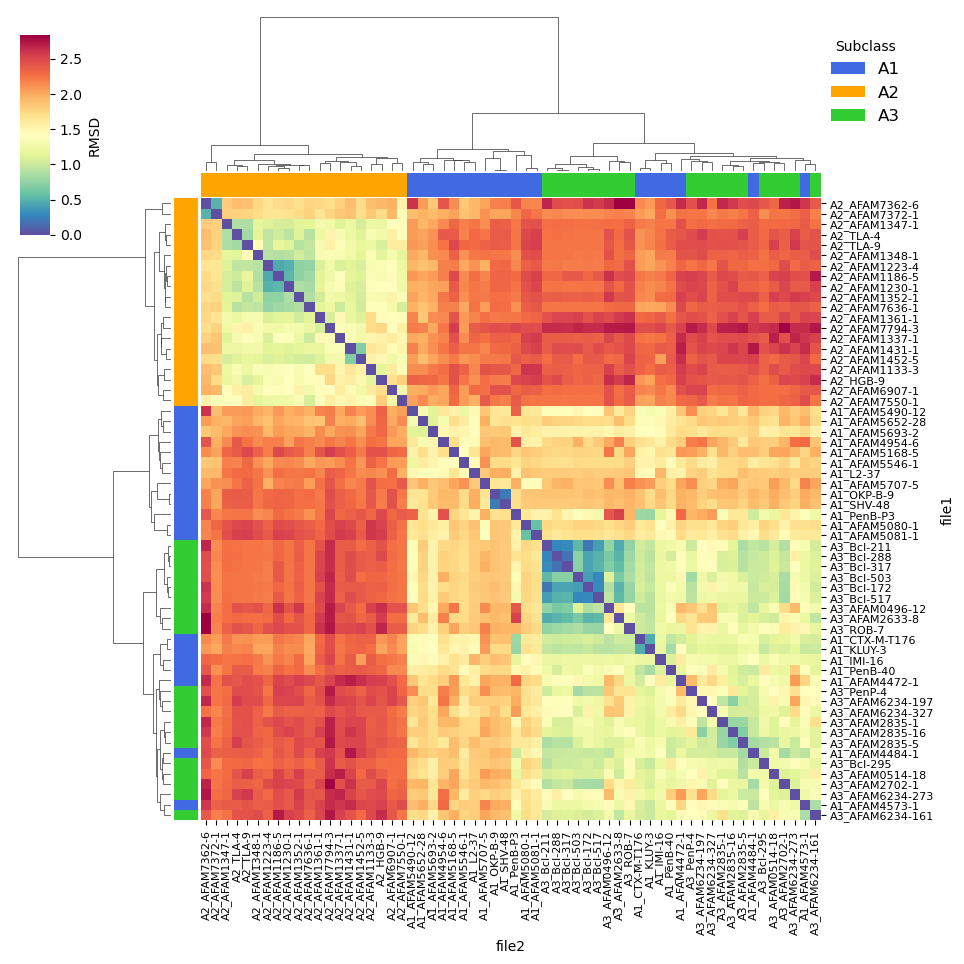

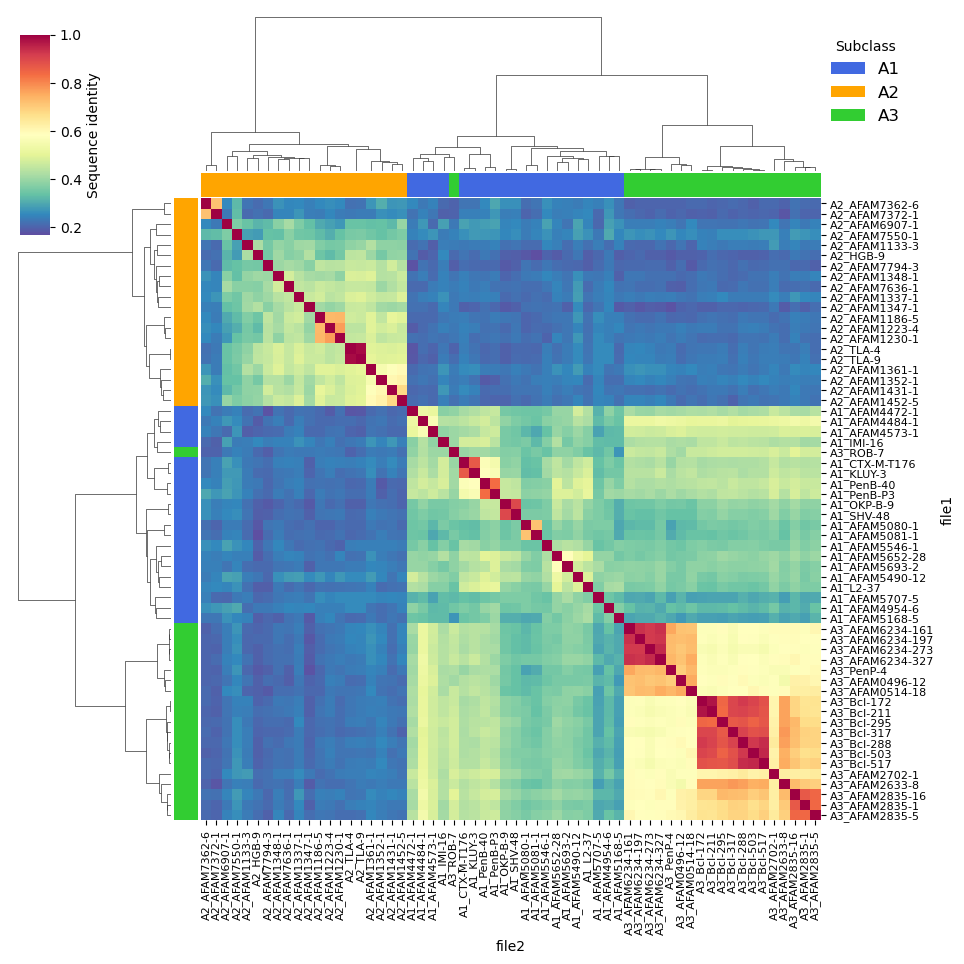

In [35]:
do_clustermap2("rmsd", "RMSD")
do_clustermap2("seq_ident", "Sequence identity")

In [36]:
# set the path of the data source and create an empty list to collect data
path = "/home/gama/desktop/a2_proteobacteria_rand100/"
pdbs = []

# retrieve the paths per each pdb file
for root, dirs, files in os.walk(path):
    for file in files:
        if file.endswith(".pdb"):
            pdbs.append(os.path.join(root, file))

# create a df to save data         
df = pd.DataFrame(columns=[
    "file1","file2","len_struct1","len_struct2","aln_len","rmsd","seq_ident","tm_score1","tm_score2"])

# Align pdbs all vs all 
# pair1
for i in range(len(pdbs)):
    
    #pair2
    for j in range(len(pdbs)):
        
        # run TMalign and save the output text 
        command     = "TMalign {} {}".format(pdbs[i], pdbs[j])
        result_text = subprocess.run(command, shell=True, capture_output=True)
        output_text = result_text.stdout.decode()
        
        # collect data with regex
        len1    = re.search("Length of Chain_1 *: *([0-9.]+)", output_text).group(1)
        len2    = re.search("Length of Chain_2 *: *([0-9.]+)", output_text).group(1)
        aln_len = re.search("Aligned length *= *([0-9.]+)", output_text).group(1) 
        rmsd    = re.search("RMSD *= *([0-9.]+)", output_text).group(1)
        ident   = re.search("Seq_ID=n_identical/n_aligned *= *([0-9.]+)", output_text).group(1)
        tm1     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_1\)", output_text).group(1)
        tm2     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_2\)", output_text).group(1)
        
        # create a second df with the data and concat
        new_row = pd.DataFrame({
            "file1": pdbs[i], "file2": pdbs[j], "len_struct1": len1, "len_struct2": len2, 
            "aln_len": aln_len, "rmsd": rmsd, "seq_ident": ident, "tm_score1": tm1, "tm_score2": tm1
        }, index=[0])
        df = pd.concat([df,new_row], ignore_index=True)


In [54]:
df["file1"] = df["file1"].str.replace(".pdb", "")
df["file2"] = df["file2"].str.replace(".pdb", "")
df["file1"] = df["file2"].str.replace("/home/gama/desktop/a2_proteobacteria_rand100/", "")
df["file2"] = df["file2"].str.replace("/home/gama/desktop/a2_proteobacteria_rand100/", "")
df["file1"] = df["file2"].str.replace("-", "_")
df["file2"] = df["file2"].str.replace("-", "_")
df

/tmp/ipykernel_605/3198482393.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.

/tmp/ipykernel_605/3198482393.py:2: FutureWarning:

The default value of regex will change from True to False in a future version.



,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,AFAM0002_1,AFAM0002_1,367,367,367,0.00,1.000,1.00000,1.00000
1,AFAM6029_1,AFAM6029_1,367,335,324,2.53,0.278,0.80956,0.80956
2,AFAM6905_1,AFAM6905_1,367,305,274,1.92,0.277,0.70296,0.70296
3,AFAM6906_1,AFAM6906_1,367,295,279,2.46,0.280,0.70020,0.70020
4,AFAM6907_1,AFAM6907_1,367,293,278,1.85,0.270,0.71604,0.71604
...,...,...,...,...,...,...,...,...,...
9995,AFAM7511_1,AFAM7511_1,272,331,263,1.94,0.285,0.89796,0.89796
9996,AFAM7513_1,AFAM7513_1,272,321,260,2.17,0.262,0.88174,0.88174
9997,AFAM7518_10,AFAM7518_10,272,334,260,2.08,0.262,0.88072,0.88072
9998,AFAM7518_6,AFAM7518_6,272,334,263,2.22,0.297,0.88464,0.88464


In [56]:
df.pivot(index='file1', columns='file2', values='seq_ident')


ValueError: Index contains duplicate entries, cannot reshape

In [49]:
df.pivot(index="file1", columns="file2", values="rmsd")


ValueError: Index contains duplicate entries, cannot reshape

/tmp/ipykernel_605/3234661934.py:3: FutureWarning:

pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.

/home/gama/anaconda3/envs/str/lib/python3.9/site-packages/seaborn/matrix.py:615: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



ValueError: The number of observations cannot be determined on an empty distance matrix.

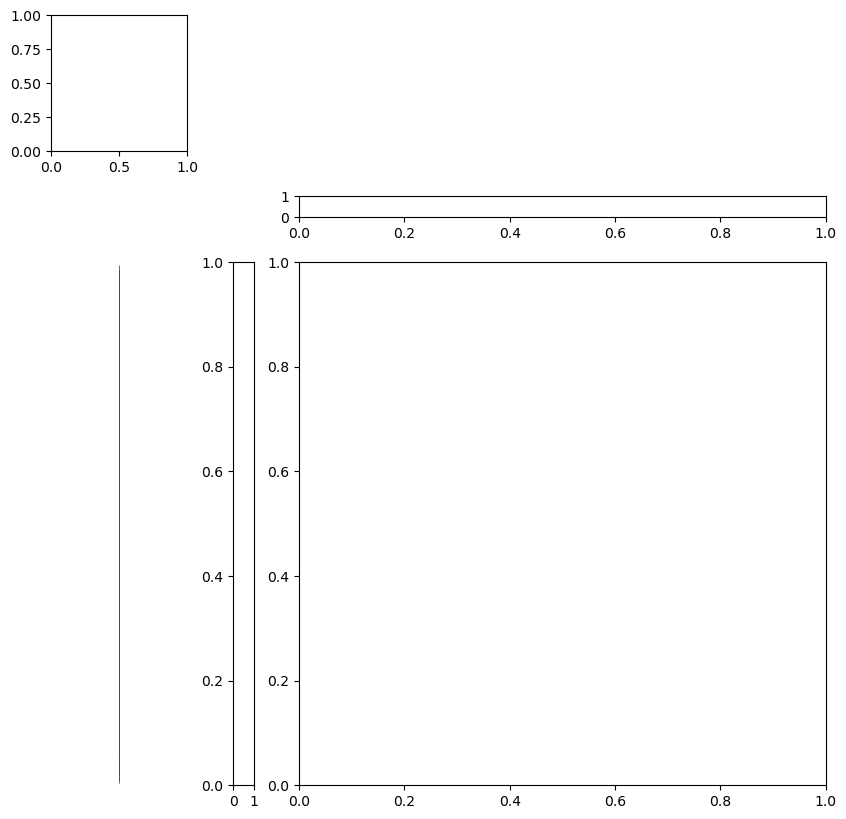

In [40]:
def do_clustermap2(col, title):
    # create a sim matrix 
    df_sim = df.pivot_table(values = col, index = "file1", columns = "file2")
    

    
    # plot
    g = sns.clustermap(
        data = df_sim, method = "ward", metric = "euclidean", annot = False, cmap = "Spectral_r",
        row_colors = colors.to_list(), col_colors = colors.to_list(), xticklabels = True, yticklabels = df_sim.index,
        cbar_kws={"label": title}, cbar_pos = (0.025, 0.76, 0.03,0.2))
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    

    
do_clustermap2("rmsd", "RMSD")
do_clustermap2("seq_ident", "Sequence identity")

In [58]:
# set the path of the data source and create an empty list to collect data
path = "/home/gama/desktop/a2_proteobacteria_rand100_plus_rand60/"
pdbs = []

# retrieve the paths per each pdb file
for root, dirs, files in os.walk(path):
    for file in files:
        if file.endswith(".pdb"):
            pdbs.append(os.path.join(root, file))

# create a df to save data         
df = pd.DataFrame(columns=[
    "file1","file2","len_struct1","len_struct2","aln_len","rmsd","seq_ident","tm_score1","tm_score2"])

# Align pdbs all vs all 
# pair1
for i in range(len(pdbs)):
    
    #pair2
    for j in range(len(pdbs)):
        
        # run TMalign and save the output text 
        command     = "TMalign {} {}".format(pdbs[i], pdbs[j])
        result_text = subprocess.run(command, shell=True, capture_output=True)
        output_text = result_text.stdout.decode()
        
        # collect data with regex
        len1    = re.search("Length of Chain_1 *: *([0-9.]+)", output_text).group(1)
        len2    = re.search("Length of Chain_2 *: *([0-9.]+)", output_text).group(1)
        aln_len = re.search("Aligned length *= *([0-9.]+)", output_text).group(1) 
        rmsd    = re.search("RMSD *= *([0-9.]+)", output_text).group(1)
        ident   = re.search("Seq_ID=n_identical/n_aligned *= *([0-9.]+)", output_text).group(1)
        tm1     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_1\)", output_text).group(1)
        tm2     = re.search("TM-score *= *([0-9.]+) *\(if normalized by length of Chain_2\)", output_text).group(1)
        
        # create a second df with the data and concat
        new_row = pd.DataFrame({
            "file1": pdbs[i], "file2": pdbs[j], "len_struct1": len1, "len_struct2": len2, 
            "aln_len": aln_len, "rmsd": rmsd, "seq_ident": ident, "tm_score1": tm1, "tm_score2": tm1
        }, index=[0])
        df = pd.concat([df,new_row], ignore_index=True)

df["file1"] = df["file1"].str.replace(".pdb", "")
df["file2"] = df["file2"].str.replace(".pdb", "")
df["file1"] = df["file2"].str.replace("-", "_")
df["file2"] = df["file2"].str.replace("-", "_")
df

/tmp/ipykernel_605/1023242934.py:43: FutureWarning:

The default value of regex will change from True to False in a future version.

/tmp/ipykernel_605/1023242934.py:44: FutureWarning:

The default value of regex will change from True to False in a future version.



,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,292,292,292,0.00,1.000,1.00000,1.00000
1,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,292,274,259,1.20,0.529,0.86805,0.86805
2,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,292,292,266,1.76,0.515,0.87791,0.87791
3,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,292,275,268,1.80,0.384,0.86784,0.86784
4,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,292,265,257,1.76,0.346,0.83169,0.83169
...,...,...,...,...,...,...,...,...,...
6395,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,288,271,271,0.83,0.472,0.92539,0.92539
6396,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,288,271,271,0.86,0.469,0.92464,0.92464
6397,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,288,271,271,0.77,0.465,0.92752,0.92752
6398,/home/gama/desktop/a2_proteobacteria_rand100_p...,/home/gama/desktop/a2_proteobacteria_rand100_p...,288,281,276,1.67,0.424,0.92149,0.92149


In [60]:
df["file1"] = df["file2"].str.replace("/home/gama/desktop/a2_proteobacteria_rand100_plus_rand60/", "")
df["file2"] = df["file2"].str.replace("/home/gama/desktop/a2_proteobacteria_rand100_plus_rand60/", "")
df

,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,A1_AFAM4472_1,A1_AFAM4472_1,292,292,292,0.00,1.000,1.00000,1.00000
1,A1_AFAM4484_1,A1_AFAM4484_1,292,274,259,1.20,0.529,0.86805,0.86805
2,A1_AFAM4573_1,A1_AFAM4573_1,292,292,266,1.76,0.515,0.87791,0.87791
3,A1_AFAM4954_6,A1_AFAM4954_6,292,275,268,1.80,0.384,0.86784,0.86784
4,A1_AFAM5080_1,A1_AFAM5080_1,292,265,257,1.76,0.346,0.83169,0.83169
...,...,...,...,...,...,...,...,...,...
6395,A3_BcI_317,A3_BcI_317,288,271,271,0.83,0.472,0.92539,0.92539
6396,A3_BcI_503,A3_BcI_503,288,271,271,0.86,0.469,0.92464,0.92464
6397,A3_BcI_517,A3_BcI_517,288,271,271,0.77,0.465,0.92752,0.92752
6398,A3_PenP_4,A3_PenP_4,288,281,276,1.67,0.424,0.92149,0.92149


In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6400 entries, 0 to 6399
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   file1        6400 non-null   object
 1   file2        6400 non-null   object
 2   len_struct1  6400 non-null   object
 3   len_struct2  6400 non-null   object
 4   aln_len      6400 non-null   object
 5   rmsd         6400 non-null   object
 6   seq_ident    6400 non-null   object
 7   tm_score1    6400 non-null   object
 8   tm_score2    6400 non-null   object
dtypes: object(9)
memory usage: 450.1+ KB


In [70]:
df['file1'] = df['file1'].astype('category')
df['file1'] = df['file1'].astype('category')
df['rmsd'] = df['rmsd'].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6400 entries, 0 to 6399
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   file1        6400 non-null   category
 1   file2        6400 non-null   object  
 2   len_struct1  6400 non-null   object  
 3   len_struct2  6400 non-null   object  
 4   aln_len      6400 non-null   object  
 5   rmsd         6400 non-null   float64 
 6   seq_ident    6400 non-null   object  
 7   tm_score1    6400 non-null   object  
 8   tm_score2    6400 non-null   object  
dtypes: category(1), float64(1), object(7)
memory usage: 409.1+ KB


In [76]:
df.to_csv("/home/gama/desktop/a2_proteobacteria_rand100_plus_rand60.csv", index = False)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6400 entries, 0 to 6399
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   file1        6400 non-null   object 
 1   file2        6400 non-null   object 
 2   len_struct1  6400 non-null   int64  
 3   len_struct2  6400 non-null   int64  
 4   aln_len      6400 non-null   int64  
 5   rmsd         6400 non-null   float64
 6   seq_ident    6400 non-null   float64
 7   tm_score1    6400 non-null   float64
 8   tm_score2    6400 non-null   float64
dtypes: float64(4), int64(3), object(2)
memory usage: 450.1+ KB


In [80]:
df = pd.read_csv("/home/gama/desktop/a2_proteobacteria_rand100_plus_rand60.csv")
df

,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,A1_AFAM4472_1,A1_AFAM4472_1,292,292,292,0.00,1.000,1.00000,1.00000
1,A1_AFAM4484_1,A1_AFAM4484_1,292,274,259,1.20,0.529,0.86805,0.86805
2,A1_AFAM4573_1,A1_AFAM4573_1,292,292,266,1.76,0.515,0.87791,0.87791
3,A1_AFAM4954_6,A1_AFAM4954_6,292,275,268,1.80,0.384,0.86784,0.86784
4,A1_AFAM5080_1,A1_AFAM5080_1,292,265,257,1.76,0.346,0.83169,0.83169
...,...,...,...,...,...,...,...,...,...
6395,A3_BcI_317,A3_BcI_317,288,271,271,0.83,0.472,0.92539,0.92539
6396,A3_BcI_503,A3_BcI_503,288,271,271,0.86,0.469,0.92464,0.92464
6397,A3_BcI_517,A3_BcI_517,288,271,271,0.77,0.465,0.92752,0.92752
6398,A3_PenP_4,A3_PenP_4,288,281,276,1.67,0.424,0.92149,0.92149


In [81]:
df[~df['file1'].duplicated()]

,file1,file2,len_struct1,len_struct2,aln_len,rmsd,seq_ident,tm_score1,tm_score2
0,A1_AFAM4472_1,A1_AFAM4472_1,292,292,292,0.00,1.000,1.00000,1.00000
1,A1_AFAM4484_1,A1_AFAM4484_1,292,274,259,1.20,0.529,0.86805,0.86805
2,A1_AFAM4573_1,A1_AFAM4573_1,292,292,266,1.76,0.515,0.87791,0.87791
3,A1_AFAM4954_6,A1_AFAM4954_6,292,275,268,1.80,0.384,0.86784,0.86784
4,A1_AFAM5080_1,A1_AFAM5080_1,292,265,257,1.76,0.346,0.83169,0.83169
...,...,...,...,...,...,...,...,...,...
75,A3_BcI_317,A3_BcI_317,292,271,262,1.39,0.427,0.87267,0.87267
76,A3_BcI_503,A3_BcI_503,292,271,264,1.48,0.417,0.87693,0.87693
77,A3_BcI_517,A3_BcI_517,292,271,262,1.25,0.424,0.87467,0.87467
78,A3_PenP_4,A3_PenP_4,292,281,270,1.91,0.407,0.88482,0.88482


In [ ]:
df['col_string'] = df['col_string'].astype('category')

/tmp/ipykernel_605/1950625559.py:3: FutureWarning:

pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.

/home/gama/anaconda3/envs/str/lib/python3.9/site-packages/seaborn/matrix.py:615: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



ValueError: The number of observations cannot be determined on an empty distance matrix.

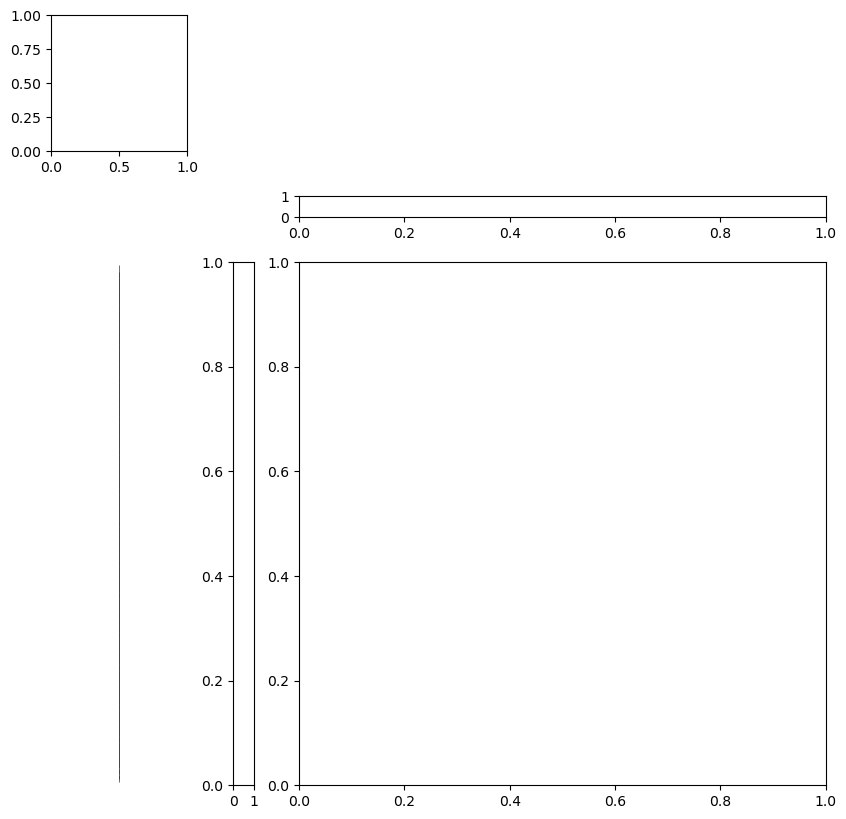

In [62]:
def do_clustermap3(col, title):
    # create a sim matrix 
    df_sim = df.pivot_table(values = col, index = "file1", columns = "file2")
    
    # create a color palette and handles
    colors = df_sim.index.str[:2].map({"A1": "royalblue", "A2": "orange", "A3": "limegreen"})
    lut = dict(zip(df_sim.index.str[:2].to_list(), colors))
    handles = [Patch(facecolor = lut[name]) for name in lut]
    
    # plot
    g = sns.clustermap(
        data = df_sim, method = "ward", metric = "euclidean", annot = False, cmap = "Spectral_r",
        row_colors = colors.to_list(), col_colors = colors.to_list(), xticklabels = True, yticklabels = df_sim.index,
        cbar_kws={"label": title}, cbar_pos = (0.025, 0.76, 0.03,0.2))
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    plt.legend(
    handles, lut, title = "Subclass", loc = "best", frameon = False, ncol = 1,
    bbox_to_anchor = (.92, .97), bbox_transform = plt.gcf().transFigure, prop = {'size': 12})
    
do_clustermap3("rmsd", "RMSD")
do_clustermap3("seq_ident", "Sequence identity")

# los plots de adelante son los de mi tesis pero bueron old sin a correcion del bug con chatGPT 

In [ ]:
# este es parte del codigo original de los plriots pero que no salico con el bug
df = pd.read_csv("../results/subclass_a/af2/wo_signal_peptide/pdbs_relax/rand60struct_stats.csv")

In [33]:
def do_clustermap(col, title):
    # create a sim matrix 
    df_sim = df.pivot_table(values = col, index = "file1", columns = "file2")
    
    # create a color palette and handles
    colors = df_sim.index.str[:2].map({"A1": "royalblue", "A2": "orange", "A3": "limegreen"})
    lut = dict(zip(df_sim.index.str[:2].to_list(), colors))
    handles = [Patch(facecolor = lut[name]) for name in lut]
    
    # plot
    g = sns.clustermap(
        data = df_sim, method = "ward", metric = "euclidean", annot = False, cmap = "Spectral_r",
        row_colors = colors.to_list(), col_colors = colors.to_list(), xticklabels = True, yticklabels = df_sim.index,
        cbar_kws={"label": title}, cbar_pos = (0.025, 0.76, 0.03,0.2))
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_xticklabels(), fontsize = 8)
    plt.legend(
    handles, lut, title = "Subclass", loc = "best", frameon = False, ncol = 1,
    bbox_to_anchor = (.92, .97), bbox_transform = plt.gcf().transFigure, prop = {'size': 12})

In [ ]:
df.head()

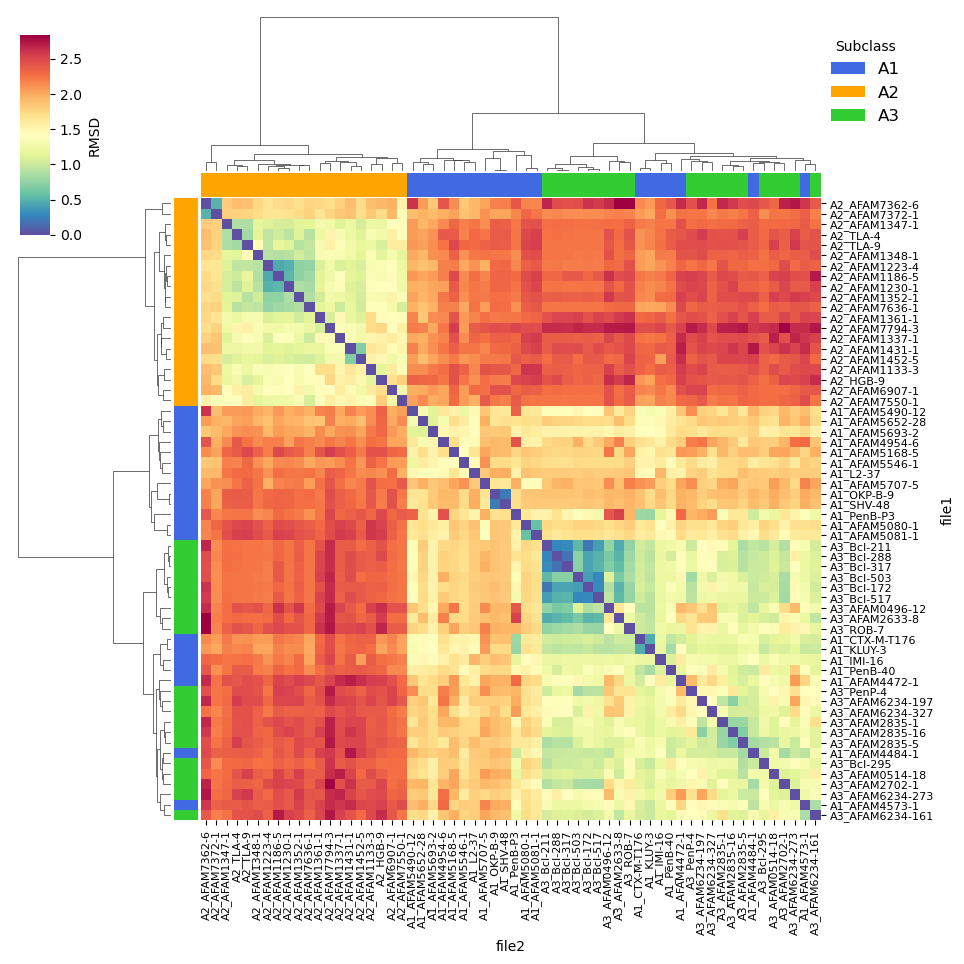

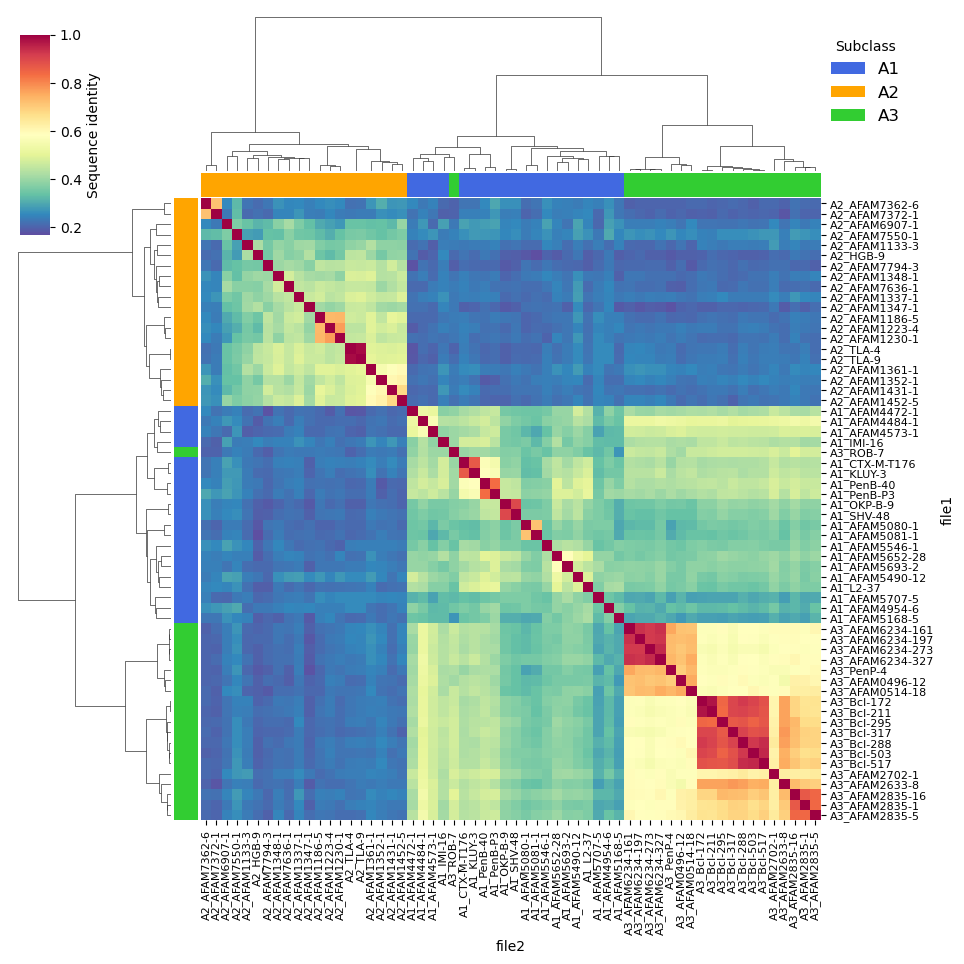

In [6]:
do_clustermap("rmsd", "RMSD")
do_clustermap("seq_ident", "Sequence identity")

Fin